In [1]:
import pandas as pd
import numpy as np
import altair as alt
import matplotlib.pyplot as plt

from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA

# To plot data with more than 5000 rows
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [3]:
# Replace 'your_file.xlsx' with the actual path to your Excel file
file_path = 'consumo_material_clean.xlsx'

In [4]:
# Read the Excel file into a pandas DataFrame
df = pd.read_excel('consumo_material_clean.xlsx')  

df.head(10)

,CODIGO,FECHAPEDIDO,NUMERO,REFERENCIA,CANTIDADCOMPRA,UNIDADESCONSUMOCONTENIDAS,PRECIO,IMPORTELINEA,TIPOCOMPRA,ORIGEN,TGL,PRODUCTO
0,E99808,01/01/23,1595724/23,178567.1,60,10,62.590000,375.540000,Compra menor,1-2-60,TRANSITO,APOSITO DE FIBRAS DE POLIACRILATO C/PLATA-3
1,B41691,01/02/16,72714/16,400403,40,10,102.803729,411.214916,Compra menor,0-10-1,ALMACENABLE,SOLUCION P/ LIMPIEZA Y DESCONTAMINACION DE HER...
2,E64543,01/02/16,71961/16,403770,20,5,12.100000,48.400000,Compra menor,0-4-111,TRANSITO,APOSITO DE HIDROFIBRA / CINTA-18
3,E65007,01/02/16,72773/16,20415,100,50,215.325000,430.650000,Concurso,0-10-1,ALMACENABLE,APOSITO DE ESPUMA POLIURETANO / SACRO-11
4,E64911,01/02/17,86159/17,20701,300,300,792.000000,792.000000,Concurso,0-6-1,ALMACENABLE,APOSITO C/ CARBON Y PLATA-6
5,E65509,01/02/17,86264/17,161445.2,80,10,53.888999,431.111992,Concurso,0-0-2,ALMACENABLE,APOSITO DE FIBRAS DE POLIACRILATO-3
6,E65894,01/02/17,86265/17,157028.4,140,10,35.189001,492.646014,Concurso,0-6-1,ALMACENABLE,APOSITO MALLADO C/ PARAFINA-39
7,E66071,01/02/17,86147/17,420680,600,10,20.900000,1254.000000,Compra menor,0-13-1,ALMACENABLE,APOSITO DE HIDROFIBRA DE HIDROCOLOIDE C/ ESPUM...
8,E64543,01/02/18,91119/18,403770,40,5,12.100000,96.800000,Compra menor,0-11-153,TRANSITO,APOSITO DE HIDROFIBRA / CINTA-18
9,E64663,01/02/18,92073/18,413568,100,100,539.005500,539.005500,Concurso,0-0-2,ALMACENABLE,APOSITO DE HIDROFIBRA DE HIDROCOLOIDE C/ PLATA-3


In [5]:
# Split the 'FECHAPEDIDO' column by '/'
df['FECHAPEDIDO'] = df['FECHAPEDIDO'].str.split('/')

# Access the individual components of the split result (assuming it is in the format DD/MM/YY)
df['DAY'] = df['FECHAPEDIDO'].apply(lambda x: x[0])
df['MONTH'] = df['FECHAPEDIDO'].apply(lambda x: x[1])
df['YEAR'] = df['FECHAPEDIDO'].apply(lambda x: x[2])

# If you want to convert the columns to numeric values, you can do:
df['DAY'] = pd.to_numeric(df['DAY'])
df['MONTH'] = pd.to_numeric(df['MONTH'])
df['YEAR'] = pd.to_numeric(df['YEAR'])

df['MONTH_YEAR'] = df['MONTH'].astype(str) + df['YEAR'].astype(str)
df['DAY_MONTH_YEAR'] = df['DAY'].astype(str) + df['MONTH'].astype(str) + df['YEAR'].astype(str)

# convert to int these columns
df['MONTH_YEAR'] = pd.to_numeric(df['MONTH_YEAR'])
df['DAY_MONTH_YEAR'] = pd.to_numeric(df['DAY_MONTH_YEAR'])

df.drop(columns=['FECHAPEDIDO'], inplace=True)

In [6]:
df.head(10)

,CODIGO,NUMERO,REFERENCIA,CANTIDADCOMPRA,UNIDADESCONSUMOCONTENIDAS,PRECIO,IMPORTELINEA,TIPOCOMPRA,ORIGEN,TGL,PRODUCTO,DAY,MONTH,YEAR,MONTH_YEAR,DAY_MONTH_YEAR
0,E99808,1595724/23,178567.1,60,10,62.590000,375.540000,Compra menor,1-2-60,TRANSITO,APOSITO DE FIBRAS DE POLIACRILATO C/PLATA-3,1,1,23,123,1123
1,B41691,72714/16,400403,40,10,102.803729,411.214916,Compra menor,0-10-1,ALMACENABLE,SOLUCION P/ LIMPIEZA Y DESCONTAMINACION DE HER...,1,2,16,216,1216
2,E64543,71961/16,403770,20,5,12.100000,48.400000,Compra menor,0-4-111,TRANSITO,APOSITO DE HIDROFIBRA / CINTA-18,1,2,16,216,1216
3,E65007,72773/16,20415,100,50,215.325000,430.650000,Concurso,0-10-1,ALMACENABLE,APOSITO DE ESPUMA POLIURETANO / SACRO-11,1,2,16,216,1216
4,E64911,86159/17,20701,300,300,792.000000,792.000000,Concurso,0-6-1,ALMACENABLE,APOSITO C/ CARBON Y PLATA-6,1,2,17,217,1217
5,E65509,86264/17,161445.2,80,10,53.888999,431.111992,Concurso,0-0-2,ALMACENABLE,APOSITO DE FIBRAS DE POLIACRILATO-3,1,2,17,217,1217
6,E65894,86265/17,157028.4,140,10,35.189001,492.646014,Concurso,0-6-1,ALMACENABLE,APOSITO MALLADO C/ PARAFINA-39,1,2,17,217,1217
7,E66071,86147/17,420680,600,10,20.900000,1254.000000,Compra menor,0-13-1,ALMACENABLE,APOSITO DE HIDROFIBRA DE HIDROCOLOIDE C/ ESPUM...,1,2,17,217,1217
8,E64543,91119/18,403770,40,5,12.100000,96.800000,Compra menor,0-11-153,TRANSITO,APOSITO DE HIDROFIBRA / CINTA-18,1,2,18,218,1218
9,E64663,92073/18,413568,100,100,539.005500,539.005500,Concurso,0-0-2,ALMACENABLE,APOSITO DE HIDROFIBRA DE HIDROCOLOIDE C/ PLATA-3,1,2,18,218,1218


In [7]:
df.describe()

,CANTIDADCOMPRA,UNIDADESCONSUMOCONTENIDAS,PRECIO,IMPORTELINEA,DAY,MONTH,YEAR,MONTH_YEAR,DAY_MONTH_YEAR
count,15698.000000,15698.000000,15698.000000,15698.000000,15698.000000,15698.000000,15698.000000,15698.000000,15698.000000
mean,369.235062,83.185820,122.893353,569.473009,15.862658,6.409925,19.797172,660.789655,49809.916932
std,758.202692,195.915475,221.454340,748.721488,8.737841,3.361879,2.459485,336.042375,74161.621342
min,1.000000,1.000000,0.989571,0.000000,1.000000,1.000000,15.000000,115.000000,1123.000000
25%,40.000000,5.000000,13.959000,121.000000,8.000000,4.000000,18.000000,415.000000,11118.000000
50%,120.000000,10.000000,44.000000,322.080000,16.000000,6.000000,20.000000,623.000000,20919.000000
75%,330.000000,50.000000,102.802000,719.949286,23.000000,9.000000,22.000000,922.000000,30522.750000
max,10000.000000,2000.000000,2458.500000,11439.928600,31.000000,12.000000,23.000000,1222.000000,311215.000000


In [8]:
# line chart of the number of orders per year, grouped by CODIGO
alt.Chart(df).mark_line().encode(
    x='YEAR',
    y='count()',
    color='CODIGO'
)

alt.Chart(...)

In [9]:
# Create a new column combining month number and month name
df['MONTH_NAME'] = df['MONTH'].astype(str) + '-' + pd.to_datetime(df['MONTH'], format='%m').dt.month_name()
df['MONTH_NAME']

0          1-January
1         2-February
2         2-February
3         2-February
4         2-February
            ...     
15693     10-October
15694     10-October
15695     10-October
15696     10-October
15697    12-December
Name: MONTH_NAME, Length: 15698, dtype: object

In [10]:
# line chart of the number of orders per month, grouped by CODIGO and year including the number of the month
alt.Chart(df).mark_line().encode(
    x=alt.X('MONTH_NAME', axis=alt.Axis(title='Month')),
    y=alt.Y('count()', axis=alt.Axis(title='Number of Orders')),
    color='CODIGO',
    column='YEAR',
    tooltip=['MONTH_NAME']
).properties(
    title='Number of Orders per Month, Grouped by CODIGO and Year'
)

alt.Chart(...)

## One hot encoding TIPOCOMPRA and TGL

In [11]:
# one-hot encoding CONCURSO
df = pd.get_dummies(df, columns=['TIPOCOMPRA'])

# make TIPOCOMPRA_CONCURSO a 0 1 column
df['TIPOCOMPRA_Concurso'] = df['TIPOCOMPRA_Concurso'].apply(lambda x: 1 if x == 1 else 0)
df['TIPOCOMPRA_Compra menor'] = df['TIPOCOMPRA_Compra menor'].apply(lambda x: 1 if x == 1 else 0)

df.head(10)

,CODIGO,NUMERO,REFERENCIA,CANTIDADCOMPRA,UNIDADESCONSUMOCONTENIDAS,PRECIO,IMPORTELINEA,ORIGEN,TGL,PRODUCTO,DAY,MONTH,YEAR,MONTH_YEAR,DAY_MONTH_YEAR,MONTH_NAME,TIPOCOMPRA_Compra menor,TIPOCOMPRA_Concurso
0,E99808,1595724/23,178567.1,60,10,62.590000,375.540000,1-2-60,TRANSITO,APOSITO DE FIBRAS DE POLIACRILATO C/PLATA-3,1,1,23,123,1123,1-January,1,0
1,B41691,72714/16,400403,40,10,102.803729,411.214916,0-10-1,ALMACENABLE,SOLUCION P/ LIMPIEZA Y DESCONTAMINACION DE HER...,1,2,16,216,1216,2-February,1,0
2,E64543,71961/16,403770,20,5,12.100000,48.400000,0-4-111,TRANSITO,APOSITO DE HIDROFIBRA / CINTA-18,1,2,16,216,1216,2-February,1,0
3,E65007,72773/16,20415,100,50,215.325000,430.650000,0-10-1,ALMACENABLE,APOSITO DE ESPUMA POLIURETANO / SACRO-11,1,2,16,216,1216,2-February,0,1
4,E64911,86159/17,20701,300,300,792.000000,792.000000,0-6-1,ALMACENABLE,APOSITO C/ CARBON Y PLATA-6,1,2,17,217,1217,2-February,0,1
5,E65509,86264/17,161445.2,80,10,53.888999,431.111992,0-0-2,ALMACENABLE,APOSITO DE FIBRAS DE POLIACRILATO-3,1,2,17,217,1217,2-February,0,1
6,E65894,86265/17,157028.4,140,10,35.189001,492.646014,0-6-1,ALMACENABLE,APOSITO MALLADO C/ PARAFINA-39,1,2,17,217,1217,2-February,0,1
7,E66071,86147/17,420680,600,10,20.900000,1254.000000,0-13-1,ALMACENABLE,APOSITO DE HIDROFIBRA DE HIDROCOLOIDE C/ ESPUM...,1,2,17,217,1217,2-February,1,0
8,E64543,91119/18,403770,40,5,12.100000,96.800000,0-11-153,TRANSITO,APOSITO DE HIDROFIBRA / CINTA-18,1,2,18,218,1218,2-February,1,0
9,E64663,92073/18,413568,100,100,539.005500,539.005500,0-0-2,ALMACENABLE,APOSITO DE HIDROFIBRA DE HIDROCOLOIDE C/ PLATA-3,1,2,18,218,1218,2-February,0,1


In [12]:
# one-hot encoding CONCURSO
df = pd.get_dummies(df, columns=['TGL'])

# make TIPOCOMPRA_CONCURSO a 0 1 column
df['TGL_ALMACENABLE'] = df['TGL_ALMACENABLE'].apply(lambda x: 1 if x == 1 else 0)
df['TGL_TRANSITO'] = df['TGL_TRANSITO'].apply(lambda x: 1 if x == 1 else 0)

df.head(10)

,CODIGO,NUMERO,REFERENCIA,CANTIDADCOMPRA,UNIDADESCONSUMOCONTENIDAS,PRECIO,IMPORTELINEA,ORIGEN,PRODUCTO,DAY,MONTH,YEAR,MONTH_YEAR,DAY_MONTH_YEAR,MONTH_NAME,TIPOCOMPRA_Compra menor,TIPOCOMPRA_Concurso,TGL_ALMACENABLE,TGL_TRANSITO
0,E99808,1595724/23,178567.1,60,10,62.590000,375.540000,1-2-60,APOSITO DE FIBRAS DE POLIACRILATO C/PLATA-3,1,1,23,123,1123,1-January,1,0,0,1
1,B41691,72714/16,400403,40,10,102.803729,411.214916,0-10-1,SOLUCION P/ LIMPIEZA Y DESCONTAMINACION DE HER...,1,2,16,216,1216,2-February,1,0,1,0
2,E64543,71961/16,403770,20,5,12.100000,48.400000,0-4-111,APOSITO DE HIDROFIBRA / CINTA-18,1,2,16,216,1216,2-February,1,0,0,1
3,E65007,72773/16,20415,100,50,215.325000,430.650000,0-10-1,APOSITO DE ESPUMA POLIURETANO / SACRO-11,1,2,16,216,1216,2-February,0,1,1,0
4,E64911,86159/17,20701,300,300,792.000000,792.000000,0-6-1,APOSITO C/ CARBON Y PLATA-6,1,2,17,217,1217,2-February,0,1,1,0
5,E65509,86264/17,161445.2,80,10,53.888999,431.111992,0-0-2,APOSITO DE FIBRAS DE POLIACRILATO-3,1,2,17,217,1217,2-February,0,1,1,0
6,E65894,86265/17,157028.4,140,10,35.189001,492.646014,0-6-1,APOSITO MALLADO C/ PARAFINA-39,1,2,17,217,1217,2-February,0,1,1,0
7,E66071,86147/17,420680,600,10,20.900000,1254.000000,0-13-1,APOSITO DE HIDROFIBRA DE HIDROCOLOIDE C/ ESPUM...,1,2,17,217,1217,2-February,1,0,1,0
8,E64543,91119/18,403770,40,5,12.100000,96.800000,0-11-153,APOSITO DE HIDROFIBRA / CINTA-18,1,2,18,218,1218,2-February,1,0,0,1
9,E64663,92073/18,413568,100,100,539.005500,539.005500,0-0-2,APOSITO DE HIDROFIBRA DE HIDROCOLOIDE C/ PLATA-3,1,2,18,218,1218,2-February,0,1,1,0


## Separate region-hospital-department

In [13]:
# separate ORIGEN column into region-hospital-department
df['ORIGEN'] = df['ORIGEN'].str.split('-')
df['REGION'] = df['ORIGEN'].apply(lambda x: x[0])
df['HOSPITAL'] = df['ORIGEN'].apply(lambda x: x[1])
df['DEPARTMENT'] = df['ORIGEN'].apply(lambda x: x[2])
df.drop(columns=['ORIGEN'], inplace=True)

In [14]:
df.head(10)

,CODIGO,NUMERO,REFERENCIA,CANTIDADCOMPRA,UNIDADESCONSUMOCONTENIDAS,PRECIO,IMPORTELINEA,PRODUCTO,DAY,MONTH,...,MONTH_YEAR,DAY_MONTH_YEAR,MONTH_NAME,TIPOCOMPRA_Compra menor,TIPOCOMPRA_Concurso,TGL_ALMACENABLE,TGL_TRANSITO,REGION,HOSPITAL,DEPARTMENT
0,E99808,1595724/23,178567.1,60,10,62.590000,375.540000,APOSITO DE FIBRAS DE POLIACRILATO C/PLATA-3,1,1,...,123,1123,1-January,1,0,0,1,1,2,60
1,B41691,72714/16,400403,40,10,102.803729,411.214916,SOLUCION P/ LIMPIEZA Y DESCONTAMINACION DE HER...,1,2,...,216,1216,2-February,1,0,1,0,0,10,1
2,E64543,71961/16,403770,20,5,12.100000,48.400000,APOSITO DE HIDROFIBRA / CINTA-18,1,2,...,216,1216,2-February,1,0,0,1,0,4,111
3,E65007,72773/16,20415,100,50,215.325000,430.650000,APOSITO DE ESPUMA POLIURETANO / SACRO-11,1,2,...,216,1216,2-February,0,1,1,0,0,10,1
4,E64911,86159/17,20701,300,300,792.000000,792.000000,APOSITO C/ CARBON Y PLATA-6,1,2,...,217,1217,2-February,0,1,1,0,0,6,1
5,E65509,86264/17,161445.2,80,10,53.888999,431.111992,APOSITO DE FIBRAS DE POLIACRILATO-3,1,2,...,217,1217,2-February,0,1,1,0,0,0,2
6,E65894,86265/17,157028.4,140,10,35.189001,492.646014,APOSITO MALLADO C/ PARAFINA-39,1,2,...,217,1217,2-February,0,1,1,0,0,6,1
7,E66071,86147/17,420680,600,10,20.900000,1254.000000,APOSITO DE HIDROFIBRA DE HIDROCOLOIDE C/ ESPUM...,1,2,...,217,1217,2-February,1,0,1,0,0,13,1
8,E64543,91119/18,403770,40,5,12.100000,96.800000,APOSITO DE HIDROFIBRA / CINTA-18,1,2,...,218,1218,2-February,1,0,0,1,0,11,153
9,E64663,92073/18,413568,100,100,539.005500,539.005500,APOSITO DE HIDROFIBRA DE HIDROCOLOIDE C/ PLATA-3,1,2,...,218,1218,2-February,0,1,1,0,0,0,2


## get a column containing CODIGO to unique numerical ids, same for REFERENCIA

In [15]:
df['CODIGO'] = df['CODIGO'].astype('category')  # convert to categorical
df['CODIGO'] = df['CODIGO'].cat.codes  # replace with codes
df.head(10)

,CODIGO,NUMERO,REFERENCIA,CANTIDADCOMPRA,UNIDADESCONSUMOCONTENIDAS,PRECIO,IMPORTELINEA,PRODUCTO,DAY,MONTH,...,MONTH_YEAR,DAY_MONTH_YEAR,MONTH_NAME,TIPOCOMPRA_Compra menor,TIPOCOMPRA_Concurso,TGL_ALMACENABLE,TGL_TRANSITO,REGION,HOSPITAL,DEPARTMENT
0,37,1595724/23,178567.1,60,10,62.590000,375.540000,APOSITO DE FIBRAS DE POLIACRILATO C/PLATA-3,1,1,...,123,1123,1-January,1,0,0,1,1,2,60
1,1,72714/16,400403,40,10,102.803729,411.214916,SOLUCION P/ LIMPIEZA Y DESCONTAMINACION DE HER...,1,2,...,216,1216,2-February,1,0,1,0,0,10,1
2,5,71961/16,403770,20,5,12.100000,48.400000,APOSITO DE HIDROFIBRA / CINTA-18,1,2,...,216,1216,2-February,1,0,0,1,0,4,111
3,19,72773/16,20415,100,50,215.325000,430.650000,APOSITO DE ESPUMA POLIURETANO / SACRO-11,1,2,...,216,1216,2-February,0,1,1,0,0,10,1
4,14,86159/17,20701,300,300,792.000000,792.000000,APOSITO C/ CARBON Y PLATA-6,1,2,...,217,1217,2-February,0,1,1,0,0,6,1
5,25,86264/17,161445.2,80,10,53.888999,431.111992,APOSITO DE FIBRAS DE POLIACRILATO-3,1,2,...,217,1217,2-February,0,1,1,0,0,0,2
6,26,86265/17,157028.4,140,10,35.189001,492.646014,APOSITO MALLADO C/ PARAFINA-39,1,2,...,217,1217,2-February,0,1,1,0,0,6,1
7,27,86147/17,420680,600,10,20.900000,1254.000000,APOSITO DE HIDROFIBRA DE HIDROCOLOIDE C/ ESPUM...,1,2,...,217,1217,2-February,1,0,1,0,0,13,1
8,5,91119/18,403770,40,5,12.100000,96.800000,APOSITO DE HIDROFIBRA / CINTA-18,1,2,...,218,1218,2-February,1,0,0,1,0,11,153
9,7,92073/18,413568,100,100,539.005500,539.005500,APOSITO DE HIDROFIBRA DE HIDROCOLOIDE C/ PLATA-3,1,2,...,218,1218,2-February,0,1,1,0,0,0,2


In [16]:
df['REFERENCIA'] = df['REFERENCIA'].astype('category')  # convert to categorical
df['REFERENCIA'] = df['REFERENCIA'].cat.codes  # replace with codes
df.head(10)

,CODIGO,NUMERO,REFERENCIA,CANTIDADCOMPRA,UNIDADESCONSUMOCONTENIDAS,PRECIO,IMPORTELINEA,PRODUCTO,DAY,MONTH,...,MONTH_YEAR,DAY_MONTH_YEAR,MONTH_NAME,TIPOCOMPRA_Compra menor,TIPOCOMPRA_Concurso,TGL_ALMACENABLE,TGL_TRANSITO,REGION,HOSPITAL,DEPARTMENT
0,37,1595724/23,16,60,10,62.590000,375.540000,APOSITO DE FIBRAS DE POLIACRILATO C/PLATA-3,1,1,...,123,1123,1-January,1,0,0,1,1,2,60
1,1,72714/16,38,40,10,102.803729,411.214916,SOLUCION P/ LIMPIEZA Y DESCONTAMINACION DE HER...,1,2,...,216,1216,2-February,1,0,1,0,0,10,1
2,5,71961/16,40,20,5,12.100000,48.400000,APOSITO DE HIDROFIBRA / CINTA-18,1,2,...,216,1216,2-February,1,0,0,1,0,4,111
3,19,72773/16,18,100,50,215.325000,430.650000,APOSITO DE ESPUMA POLIURETANO / SACRO-11,1,2,...,216,1216,2-February,0,1,1,0,0,10,1
4,14,86159/17,19,300,300,792.000000,792.000000,APOSITO C/ CARBON Y PLATA-6,1,2,...,217,1217,2-February,0,1,1,0,0,6,1
5,25,86264/17,11,80,10,53.888999,431.111992,APOSITO DE FIBRAS DE POLIACRILATO-3,1,2,...,217,1217,2-February,0,1,1,0,0,0,2
6,26,86265/17,10,140,10,35.189001,492.646014,APOSITO MALLADO C/ PARAFINA-39,1,2,...,217,1217,2-February,0,1,1,0,0,6,1
7,27,86147/17,47,600,10,20.900000,1254.000000,APOSITO DE HIDROFIBRA DE HIDROCOLOIDE C/ ESPUM...,1,2,...,217,1217,2-February,1,0,1,0,0,13,1
8,5,91119/18,40,40,5,12.100000,96.800000,APOSITO DE HIDROFIBRA / CINTA-18,1,2,...,218,1218,2-February,1,0,0,1,0,11,153
9,7,92073/18,45,100,100,539.005500,539.005500,APOSITO DE HIDROFIBRA DE HIDROCOLOIDE C/ PLATA-3,1,2,...,218,1218,2-February,0,1,1,0,0,0,2


## check for null/empty departments

In [17]:
# check for null/empty DEPARTMENT values
df['DEPARTMENT'].isnull().values.any()

False

In [18]:
#check for values in DEPARTMENT which are ' '
df['DEPARTMENT'].str.contains('').values.any()

df = df[df['DEPARTMENT']!='']

## KNN

In [41]:
df.columns

Index(['CODIGO', 'NUMERO', 'REFERENCIA', 'CANTIDADCOMPRA',
       'UNIDADESCONSUMOCONTENIDAS', 'PRECIO', 'IMPORTELINEA', 'PRODUCTO',
       'DAY', 'MONTH', 'YEAR', 'MONTH_YEAR', 'DAY_MONTH_YEAR', 'MONTH_NAME',
       'TIPOCOMPRA_Compra menor', 'TIPOCOMPRA_Concurso', 'TGL_ALMACENABLE',
       'TGL_TRANSITO', 'REGION', 'HOSPITAL', 'DEPARTMENT', 'CLUSTER'],
      dtype='object')

In [20]:
# Extract relevant features for KNN
features = df[['CODIGO', 'CANTIDADCOMPRA', 'PRECIO', 'IMPORTELINEA', 'DAY', 'MONTH', 'YEAR', 'TIPOCOMPRA_Concurso', 'TIPOCOMPRA_Compra menor', 'TGL_ALMACENABLE', 'TGL_TRANSITO', 'REFERENCIA', 'REGION', 'HOSPITAL', 'DEPARTMENT']]

# Scale the features
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

In [21]:
# Apply PCA for dimensionality reduction
pca = PCA(n_components=2)
features_2d = pca.fit_transform(features_scaled)

C:\Users\mirei\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\mirei\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\mirei\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\mirei\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
 

C:\Users\mirei\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\mirei\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\mirei\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\mirei\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
 

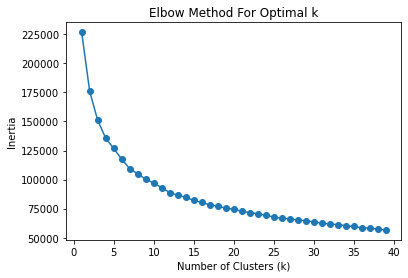

In [22]:
# Initialize a range of k values
k_values = range(1, 40)

# Fit KMeans for each k and calculate the inertia (sum of squared distances to the closest centroid)
inertia = []
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(features_scaled)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(k_values, inertia, marker='o')
plt.title('Elbow Method For Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()

In [23]:
# Fit KMeans with the optimal k
k = 20
knn_model = NearestNeighbors(n_neighbors=k, algorithm='auto')
knn_model.fit(features_scaled)

NearestNeighbors(n_neighbors=20)

In [24]:
# Assume you want to find similar products for the first product in your dataset
query_product = features_scaled[0].reshape(1, -1)
distances, indices = knn_model.kneighbors(query_product)

In [25]:
# Display the k-nearest neighbors
similar_products = df.iloc[indices[0]]['PRODUCTO']
print("Similar products:")
print(similar_products)

Similar products:
0              APOSITO DE FIBRAS DE POLIACRILATO C/PLATA-3
5058     EQ. DE PRESION NEGATIVA / Espuma de poliuretan...
1110     EQ. DE PRESION NEGATIVA / Espuma de poliuretan...
5057     EQ. DE PRESION NEGATIVA / Espuma de poliuretan...
5599     EQ. DE PRESION NEGATIVA / Espuma de poliuretan...
4550     EQ. DE PRESION NEGATIVA / Espuma de poliuretan...
3642     EQ. DE PRESION NEGATIVA / Espuma de poliuretan...
5671     EQ. DE PRESION NEGATIVA / Espuma de poliuretan...
136      EQ. DE PRESION NEGATIVA / Espuma de poliuretan...
656      EQ. DE PRESION NEGATIVA / Espuma de poliuretan...
2197     EQ. DE PRESION NEGATIVA / Espuma de poliuretan...
6247     EQ. DE PRESION NEGATIVA / Espuma de poliuretan...
8312     EQ. DE PRESION NEGATIVA / Espuma de poliuretan...
7875     EQ. DE PRESION NEGATIVA / Espuma de poliuretan...
7713     EQ. DE PRESION NEGATIVA / Espuma de poliuretan...
8355     EQ. DE PRESION NEGATIVA / Espuma de poliuretan...
9749     EQ. DE PRESION NEGATIVA / Esp

## Clusters: Kmeans

C:\Users\mirei\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


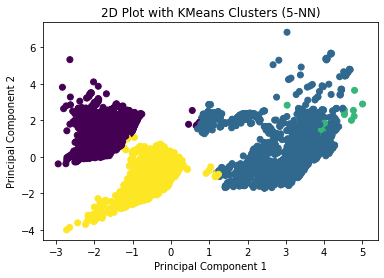

In [26]:
# Fit KMeans clustering on the features
kmeans = KMeans(n_clusters=4, random_state=42)
cluster_labels = kmeans.fit_predict(features_scaled)

# Plot the 2D data with different colors for each cluster
plt.scatter(features_2d[:, 0], features_2d[:, 1], c=cluster_labels, cmap='viridis', label='Clusters')
plt.title('2D Plot with KMeans Clusters (5-NN)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

In [27]:
# Add cluster labels to the DataFrame
df['CLUSTER'] = cluster_labels
df.head(10)

,CODIGO,NUMERO,REFERENCIA,CANTIDADCOMPRA,UNIDADESCONSUMOCONTENIDAS,PRECIO,IMPORTELINEA,PRODUCTO,DAY,MONTH,...,DAY_MONTH_YEAR,MONTH_NAME,TIPOCOMPRA_Compra menor,TIPOCOMPRA_Concurso,TGL_ALMACENABLE,TGL_TRANSITO,REGION,HOSPITAL,DEPARTMENT,CLUSTER
0,37,1595724/23,16,60,10,62.590000,375.540000,APOSITO DE FIBRAS DE POLIACRILATO C/PLATA-3,1,1,...,1123,1-January,1,0,0,1,1,2,60,2
1,1,72714/16,38,40,10,102.803729,411.214916,SOLUCION P/ LIMPIEZA Y DESCONTAMINACION DE HER...,1,2,...,1216,2-February,1,0,1,0,0,10,1,3
2,5,71961/16,40,20,5,12.100000,48.400000,APOSITO DE HIDROFIBRA / CINTA-18,1,2,...,1216,2-February,1,0,0,1,0,4,111,1
3,19,72773/16,18,100,50,215.325000,430.650000,APOSITO DE ESPUMA POLIURETANO / SACRO-11,1,2,...,1216,2-February,0,1,1,0,0,10,1,0
4,14,86159/17,19,300,300,792.000000,792.000000,APOSITO C/ CARBON Y PLATA-6,1,2,...,1217,2-February,0,1,1,0,0,6,1,0
5,25,86264/17,11,80,10,53.888999,431.111992,APOSITO DE FIBRAS DE POLIACRILATO-3,1,2,...,1217,2-February,0,1,1,0,0,0,2,0
6,26,86265/17,10,140,10,35.189001,492.646014,APOSITO MALLADO C/ PARAFINA-39,1,2,...,1217,2-February,0,1,1,0,0,6,1,0
7,27,86147/17,47,600,10,20.900000,1254.000000,APOSITO DE HIDROFIBRA DE HIDROCOLOIDE C/ ESPUM...,1,2,...,1217,2-February,1,0,1,0,0,13,1,3
8,5,91119/18,40,40,5,12.100000,96.800000,APOSITO DE HIDROFIBRA / CINTA-18,1,2,...,1218,2-February,1,0,0,1,0,11,153,1
9,7,92073/18,45,100,100,539.005500,539.005500,APOSITO DE HIDROFIBRA DE HIDROCOLOIDE C/ PLATA-3,1,2,...,1218,2-February,0,1,1,0,0,0,2,0


## Visualizations

In [28]:
df0 = df[df['CLUSTER']==0]

alt.Chart(df0).mark_line().encode(
    x=alt.X('MONTH', axis=alt.Axis(title='Month')),
    y=alt.Y('mean(IMPORTELINEA)', axis=alt.Axis(title='Price')),
    color='PRODUCTO:N',  
).properties(
    title='Average Price per Month, Grouped by Cluster, Product, and Year'
)

alt.Chart(...)

In [29]:
df1 = df[df['CLUSTER']==1]

alt.Chart(df1).mark_line().encode(
    x=alt.X('MONTH', axis=alt.Axis(title='Month')),
    y=alt.Y('mean(IMPORTELINEA)', axis=alt.Axis(title='Price')),
    color='PRODUCTO:N',  
).properties(
    title='Average Price per Month, Grouped by Cluster, Product, and Year'
)

alt.Chart(...)

In [30]:
df2 = df[df['CLUSTER']==2]

alt.Chart(df2).mark_line().encode(
    x=alt.X('MONTH', axis=alt.Axis(title='Month')),
    y=alt.Y('mean(IMPORTELINEA)', axis=alt.Axis(title='Price')),
    color='PRODUCTO:N',  
).properties(
    title='Average Price per Month, Grouped by Cluster, Product, and Year'
)

alt.Chart(...)

In [31]:
df3 = df[df['CLUSTER']==3]

alt.Chart(df2).mark_line().encode(
    x=alt.X('MONTH', axis=alt.Axis(title='Month')),
    y=alt.Y('mean(IMPORTELINEA)', axis=alt.Axis(title='Price')),
    color='PRODUCTO:N',  
).properties(
    title='Average Price per Month, Grouped by Cluster, Product, and Year'
)

alt.Chart(...)

In [32]:
df0

,CODIGO,NUMERO,REFERENCIA,CANTIDADCOMPRA,UNIDADESCONSUMOCONTENIDAS,PRECIO,IMPORTELINEA,PRODUCTO,DAY,MONTH,...,DAY_MONTH_YEAR,MONTH_NAME,TIPOCOMPRA_Compra menor,TIPOCOMPRA_Concurso,TGL_ALMACENABLE,TGL_TRANSITO,REGION,HOSPITAL,DEPARTMENT,CLUSTER
3,19,72773/16,18,100,50,215.325000,430.650000,APOSITO DE ESPUMA POLIURETANO / SACRO-11,1,2,...,1216,2-February,0,1,1,0,0,10,1,0
4,14,86159/17,19,300,300,792.000000,792.000000,APOSITO C/ CARBON Y PLATA-6,1,2,...,1217,2-February,0,1,1,0,0,6,1,0
5,25,86264/17,11,80,10,53.888999,431.111992,APOSITO DE FIBRAS DE POLIACRILATO-3,1,2,...,1217,2-February,0,1,1,0,0,0,2,0
6,26,86265/17,10,140,10,35.189001,492.646014,APOSITO MALLADO C/ PARAFINA-39,1,2,...,1217,2-February,0,1,1,0,0,6,1,0
9,7,92073/18,45,100,100,539.005500,539.005500,APOSITO DE HIDROFIBRA DE HIDROCOLOIDE C/ PLATA-3,1,2,...,1218,2-February,0,1,1,0,0,0,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15667,34,1328479/22,29,400,10,27.280155,1091.206200,APÓSITO DE ESPUMA DE POLIURETANO Y POLIACRILAT...,31,10,...,311022,10-October,0,1,1,0,0,10,1,0
15668,35,1328477/22,28,110,10,20.899808,229.897888,APÓSITO DE ESPUMA DE POLIURETANO Y POLIACRILAT...,31,10,...,311022,10-October,0,1,1,0,0,0,2,0
15673,7,1328523/22,45,305,5,26.399925,1610.395425,APOSITO DE HIDROFIBRA DE HIDROCOLOIDE C/ PLATA-3,31,10,...,311022,10-October,0,1,1,0,0,10,1,0
15674,23,1328479/22,27,210,5,5.652900,237.421800,APOSITO DE HIDROCOLOIDE-3,31,10,...,311022,10-October,0,1,1,0,0,10,1,0


In [33]:
df1

,CODIGO,NUMERO,REFERENCIA,CANTIDADCOMPRA,UNIDADESCONSUMOCONTENIDAS,PRECIO,IMPORTELINEA,PRODUCTO,DAY,MONTH,...,DAY_MONTH_YEAR,MONTH_NAME,TIPOCOMPRA_Compra menor,TIPOCOMPRA_Concurso,TGL_ALMACENABLE,TGL_TRANSITO,REGION,HOSPITAL,DEPARTMENT,CLUSTER
2,5,71961/16,40,20,5,12.100,48.40,APOSITO DE HIDROFIBRA / CINTA-18,1,2,...,1216,2-February,1,0,0,1,0,4,111,1
8,5,91119/18,40,40,5,12.100,96.80,APOSITO DE HIDROFIBRA / CINTA-18,1,2,...,1218,2-February,1,0,0,1,0,11,153,1
10,13,91173/18,1,350,350,577.500,577.50,APÓSITO ADHESIVO ABSORBENTE IMPERMEABLE C/ BOL...,1,2,...,1218,2-February,0,1,0,1,0,6,95,1
14,10,101923/19,20,50,5,13.497,134.97,APOSITO DE HIDROCOLOIDE C/ PLATA-2,1,2,...,1219,2-February,1,0,0,1,0,0,37,1
16,5,112428/21,40,50,5,12.100,121.00,APOSITO DE HIDROFIBRA / CINTA-18,1,2,...,1221,2-February,1,0,0,1,0,18,178,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15692,44,1336295/23,48,4,1,145.200,580.80,BOMBA DE UN SOLO USO / TERAPIA PRESIÓN NEGATIV...,31,10,...,311023,10-October,1,0,0,1,0,7,5,1
15693,5,1334083/23,40,30,5,12.100,72.60,APOSITO DE HIDROFIBRA / CINTA-18,31,10,...,311023,10-October,1,0,0,1,0,14,28,1
15694,5,1334092/23,40,20,5,12.100,48.40,APOSITO DE HIDROFIBRA / CINTA-18,31,10,...,311023,10-October,1,0,0,1,0,14,43,1
15695,5,1335522/23,40,10,5,12.100,24.20,APOSITO DE HIDROFIBRA / CINTA-18,31,10,...,311023,10-October,1,0,0,1,0,14,49,1


In [34]:
df2

,CODIGO,NUMERO,REFERENCIA,CANTIDADCOMPRA,UNIDADESCONSUMOCONTENIDAS,PRECIO,IMPORTELINEA,PRODUCTO,DAY,MONTH,...,DAY_MONTH_YEAR,MONTH_NAME,TIPOCOMPRA_Compra menor,TIPOCOMPRA_Concurso,TGL_ALMACENABLE,TGL_TRANSITO,REGION,HOSPITAL,DEPARTMENT,CLUSTER
0,37,1595724/23,16,60,10,62.59000,375.54000,APOSITO DE FIBRAS DE POLIACRILATO C/PLATA-3,1,1,...,1123,1-January,1,0,0,1,1,2,60,2
136,41,574119/20,43,10,5,324.14800,648.29600,EQ. DE PRESION NEGATIVA / Espuma de poliuretan...,1,6,...,1620,6-June,1,0,0,1,1,2,59,2
656,41,672354/21,43,10,5,324.14800,648.29600,EQ. DE PRESION NEGATIVA / Espuma de poliuretan...,2,7,...,2721,7-July,1,0,0,1,1,2,59,2
1110,41,500213/22,43,10,5,324.14800,648.29600,EQ. DE PRESION NEGATIVA / Espuma de poliuretan...,3,5,...,3522,5-May,1,0,0,1,1,2,59,2
1238,41,830915/20,43,10,5,324.14800,648.29600,EQ. DE PRESION NEGATIVA / Espuma de poliuretan...,3,8,...,3820,8-August,1,0,0,1,1,2,59,2
1490,39,129384/21,44,40,10,543.84000,2175.36000,APOSITO ESPUMA DE POLIVINILO ALCOHOL P/ TERAP...,4,2,...,4221,2-February,1,0,0,1,1,2,156,2
1920,38,1102970/21,41,3,3,1211.40800,1211.40800,EQ. DE PRESIÓN NEGATIVA ABDOMINAL-29,4,11,...,41121,11-November,1,0,0,1,1,2,175,2
2197,41,589693/20,43,10,5,324.14800,648.29600,EQ. DE PRESION NEGATIVA / Espuma de poliuretan...,5,6,...,5620,6-June,1,0,0,1,1,2,59,2
2371,41,980141/21,43,10,5,324.14800,648.29600,EQ. DE PRESION NEGATIVA / Espuma de poliuretan...,5,10,...,51021,10-October,1,0,0,1,1,2,59,2
2474,41,1141431/19,43,5,5,324.14800,324.14800,EQ. DE PRESION NEGATIVA / Espuma de poliuretan...,5,12,...,51219,12-December,1,0,0,1,1,2,59,2


In [35]:
df3

,CODIGO,NUMERO,REFERENCIA,CANTIDADCOMPRA,UNIDADESCONSUMOCONTENIDAS,PRECIO,IMPORTELINEA,PRODUCTO,DAY,MONTH,...,DAY_MONTH_YEAR,MONTH_NAME,TIPOCOMPRA_Compra menor,TIPOCOMPRA_Concurso,TGL_ALMACENABLE,TGL_TRANSITO,REGION,HOSPITAL,DEPARTMENT,CLUSTER
1,1,72714/16,38,40,10,102.803729,411.214916,SOLUCION P/ LIMPIEZA Y DESCONTAMINACION DE HER...,1,2,...,1216,2-February,1,0,1,0,0,10,1,3
7,27,86147/17,47,600,10,20.900000,1254.000000,APOSITO DE HIDROFIBRA DE HIDROCOLOIDE C/ ESPUM...,1,2,...,1217,2-February,1,0,1,0,0,13,1,3
11,20,92038/18,30,882,3,1.851300,544.282200,APOSITO DE HIDROCOLOIDE-9,1,2,...,1218,2-February,1,0,1,0,0,0,2,3
12,27,92071/18,47,120,10,20.900000,250.800000,APOSITO DE HIDROFIBRA DE HIDROCOLOIDE C/ ESPUM...,1,2,...,1218,2-February,1,0,1,0,0,0,2,3
32,1,124544/23,38,220,10,134.431000,2957.482000,SOLUCION P/ LIMPIEZA Y DESCONTAMINACION DE HER...,1,2,...,1223,2-February,1,0,1,0,0,10,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15663,26,1329768/22,10,1000,10,34.980000,3498.000000,APOSITO MALLADO C/ PARAFINA-39,31,10,...,311022,10-October,1,0,1,0,0,7,3,3
15669,36,1330563/22,15,100,10,47.190000,471.900000,APOSITO DE FIBRAS DE POLIACRILATO C/PLATA-6,31,10,...,311022,10-October,1,0,1,0,0,10,1,3
15670,36,1329776/22,15,80,10,47.190000,377.520000,APOSITO DE FIBRAS DE POLIACRILATO C/PLATA-6,31,10,...,311022,10-October,1,0,1,0,0,18,1,3
15681,27,1331763/23,47,180,180,334.620000,334.620000,APOSITO DE HIDROFIBRA DE HIDROCOLOIDE C/ ESPUM...,31,10,...,311023,10-October,1,0,1,0,0,0,2,3


In [42]:
df.columns

Index(['CODIGO', 'NUMERO', 'REFERENCIA', 'CANTIDADCOMPRA',
       'UNIDADESCONSUMOCONTENIDAS', 'PRECIO', 'IMPORTELINEA', 'PRODUCTO',
       'DAY', 'MONTH', 'YEAR', 'MONTH_YEAR', 'DAY_MONTH_YEAR', 'MONTH_NAME',
       'TIPOCOMPRA_Compra menor', 'TIPOCOMPRA_Concurso', 'TGL_ALMACENABLE',
       'TGL_TRANSITO', 'REGION', 'HOSPITAL', 'DEPARTMENT', 'CLUSTER'],
      dtype='object')

In [49]:
# Extract relevant features for KNN
features = df[['CODIGO', 'REFERENCIA', 'CANTIDADCOMPRA','UNIDADESCONSUMOCONTENIDAS', 'PRECIO', 'IMPORTELINEA','DAY', 'MONTH', 'YEAR','TIPOCOMPRA_Compra menor', 'TIPOCOMPRA_Concurso', 'TGL_ALMACENABLE','TGL_TRANSITO', 'REGION', 'DEPARTMENT', 'CLUSTER']]

# Scale the features
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

In [50]:
# Apply PCA for dimensionality reduction
pca = PCA(n_components=2)
features_2d = pca.fit_transform(features)

C:\Users\mirei\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\mirei\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\mirei\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\mirei\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
 

C:\Users\mirei\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\mirei\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\mirei\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\mirei\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
 

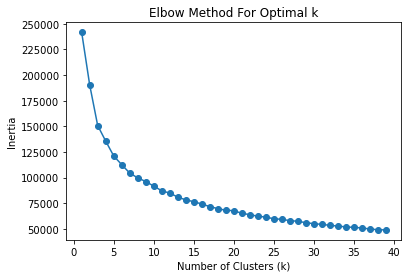

In [51]:
# Initialize a range of k values
k_values = range(1, 40)

# Fit KMeans for each k and calculate the inertia (sum of squared distances to the closest centroid)
inertia = []
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(features_scaled)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(k_values, inertia, marker='o')
plt.title('Elbow Method For Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()

C:\Users\mirei\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


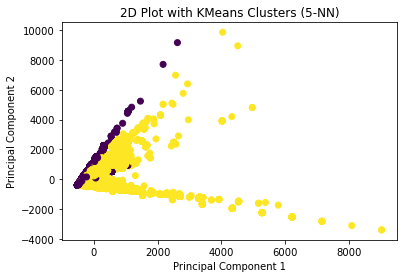

In [59]:
# Fit KMeans clustering on the features
kmeans = KMeans(n_clusters=2, random_state=42)
cluster_labels = kmeans.fit_predict(features_scaled)

# Plot the 2D data with different colors for each cluster
plt.scatter(features_2d[:, 0], features_2d[:, 1], c=cluster_labels, cmap='viridis', label='Clusters')
plt.title('2D Plot with KMeans Clusters (5-NN)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

In [60]:
# Add cluster labels to the DataFrame
df['HOSP_CLUSTER'] = cluster_labels
df.head(10)

,CODIGO,NUMERO,REFERENCIA,CANTIDADCOMPRA,UNIDADESCONSUMOCONTENIDAS,PRECIO,IMPORTELINEA,PRODUCTO,DAY,MONTH,...,MONTH_NAME,TIPOCOMPRA_Compra menor,TIPOCOMPRA_Concurso,TGL_ALMACENABLE,TGL_TRANSITO,REGION,HOSPITAL,DEPARTMENT,CLUSTER,HOSP_CLUSTER
0,37,1595724/23,16,60,10,62.590000,375.540000,APOSITO DE FIBRAS DE POLIACRILATO C/PLATA-3,1,1,...,1-January,1,0,0,1,1,2,60,2,0
1,1,72714/16,38,40,10,102.803729,411.214916,SOLUCION P/ LIMPIEZA Y DESCONTAMINACION DE HER...,1,2,...,2-February,1,0,1,0,0,10,1,3,1
2,5,71961/16,40,20,5,12.100000,48.400000,APOSITO DE HIDROFIBRA / CINTA-18,1,2,...,2-February,1,0,0,1,0,4,111,1,0
3,19,72773/16,18,100,50,215.325000,430.650000,APOSITO DE ESPUMA POLIURETANO / SACRO-11,1,2,...,2-February,0,1,1,0,0,10,1,0,1
4,14,86159/17,19,300,300,792.000000,792.000000,APOSITO C/ CARBON Y PLATA-6,1,2,...,2-February,0,1,1,0,0,6,1,0,1
5,25,86264/17,11,80,10,53.888999,431.111992,APOSITO DE FIBRAS DE POLIACRILATO-3,1,2,...,2-February,0,1,1,0,0,0,2,0,1
6,26,86265/17,10,140,10,35.189001,492.646014,APOSITO MALLADO C/ PARAFINA-39,1,2,...,2-February,0,1,1,0,0,6,1,0,1
7,27,86147/17,47,600,10,20.900000,1254.000000,APOSITO DE HIDROFIBRA DE HIDROCOLOIDE C/ ESPUM...,1,2,...,2-February,1,0,1,0,0,13,1,3,1
8,5,91119/18,40,40,5,12.100000,96.800000,APOSITO DE HIDROFIBRA / CINTA-18,1,2,...,2-February,1,0,0,1,0,11,153,1,0
9,7,92073/18,45,100,100,539.005500,539.005500,APOSITO DE HIDROFIBRA DE HIDROCOLOIDE C/ PLATA-3,1,2,...,2-February,0,1,1,0,0,0,2,0,1


In [62]:
# Add cluster labels to the DataFrame
df.rename(columns={'CLUSTER': 'PUR_CLUSTER'}, inplace=True)
df.head(10)

,CODIGO,NUMERO,REFERENCIA,CANTIDADCOMPRA,UNIDADESCONSUMOCONTENIDAS,PRECIO,IMPORTELINEA,PRODUCTO,DAY,MONTH,...,MONTH_NAME,TIPOCOMPRA_Compra menor,TIPOCOMPRA_Concurso,TGL_ALMACENABLE,TGL_TRANSITO,REGION,HOSPITAL,DEPARTMENT,PUR_CLUSTER,HOSP_CLUSTER
0,37,1595724/23,16,60,10,62.590000,375.540000,APOSITO DE FIBRAS DE POLIACRILATO C/PLATA-3,1,1,...,1-January,1,0,0,1,1,2,60,2,0
1,1,72714/16,38,40,10,102.803729,411.214916,SOLUCION P/ LIMPIEZA Y DESCONTAMINACION DE HER...,1,2,...,2-February,1,0,1,0,0,10,1,3,1
2,5,71961/16,40,20,5,12.100000,48.400000,APOSITO DE HIDROFIBRA / CINTA-18,1,2,...,2-February,1,0,0,1,0,4,111,1,0
3,19,72773/16,18,100,50,215.325000,430.650000,APOSITO DE ESPUMA POLIURETANO / SACRO-11,1,2,...,2-February,0,1,1,0,0,10,1,0,1
4,14,86159/17,19,300,300,792.000000,792.000000,APOSITO C/ CARBON Y PLATA-6,1,2,...,2-February,0,1,1,0,0,6,1,0,1
5,25,86264/17,11,80,10,53.888999,431.111992,APOSITO DE FIBRAS DE POLIACRILATO-3,1,2,...,2-February,0,1,1,0,0,0,2,0,1
6,26,86265/17,10,140,10,35.189001,492.646014,APOSITO MALLADO C/ PARAFINA-39,1,2,...,2-February,0,1,1,0,0,6,1,0,1
7,27,86147/17,47,600,10,20.900000,1254.000000,APOSITO DE HIDROFIBRA DE HIDROCOLOIDE C/ ESPUM...,1,2,...,2-February,1,0,1,0,0,13,1,3,1
8,5,91119/18,40,40,5,12.100000,96.800000,APOSITO DE HIDROFIBRA / CINTA-18,1,2,...,2-February,1,0,0,1,0,11,153,1,0
9,7,92073/18,45,100,100,539.005500,539.005500,APOSITO DE HIDROFIBRA DE HIDROCOLOIDE C/ PLATA-3,1,2,...,2-February,0,1,1,0,0,0,2,0,1


In [63]:
df.to_csv('consumo_material_clusters.csv', index=False)